# Przygotowanie

Przygotowanie Przed rozpoczęciem pracy z notatnikiem proszę zmienić jego nazwę dodając na początku numer albumu, imię i nazwisko. {nr_albumu}_{imię}_{nazwisko}_{nazwa}

Po wykonaniu wszystkich zadań proszę przesłać wypełniony notatnik przez platformę ELF za pomocą formularza "Prześlij projekt" w odpowiedniej sekcji.

# KNN

Podobnie jak w przypadku maszyny wektorów nosnych (SVC) oraz drzew decyzyjnych, KNN może słuzyc do rozwiazywania problemów zarówno klasyfikacji, jak i regresji. Algorytm KNN jest przykładem leniwego uczenia (lazy learning), co oznacza, że nie tworzy on modelu na podstawie danych uczących. Zamiast tego, w momencie klasyfikacji nowej obserwacji, algorytm poszukuje k najbardziej podobnych przypadków w zbiorze danych treningowych i przypisuje mu etykietę tej klasy, do której należy większość jego k sąsiadów.

**Algorytm KNN może być wykorzystywany zarówno do zadań klasyfikacji, jak i regresji.**

### Skalowanie danych

Jednym z istotnych elementów implementacji algorytmu KNN jest konieczność skalowania danych. Ponieważ algorytm ten opiera się na obliczaniu odległości pomiędzy punktami danych, różnice w jednostkach lub skali poszczególnych cech mogą prowadzić do zakłamanych wyników. Dlatego zazwyczaj skalowanie danych jest niezbędne, na przykład za pomocą standaryzacji lub normalizacji.

### Metryki odległości w KNN

Metryki odległości są kluczowym elementem algorytmu KNN, ponieważ definiują sposób działania algorytmu. Istnieją różne metryki odległości, z których najczęściej używanymi są:

1. *Odległość euklidesowa*: najpopularniejsza metryka odległości, która oblicza odległość między dwoma punktami w przestrzeni euklidesowej. W przypadku dwuwymiarowej przestrzeni (2D), odległość między punktami $(x_1, y_1)$ i $(x_2, y_2)$ obliczana jest jako $\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2}$. W przestrzeni trójwymiarowej (3D), dodatkowo uwzględniana jest trzecia współrzędna.

2. *Odległość Manhattan*: oblicza sumę różnic wartości bezwzględnych między odpowiadającymi współrzędnymi punktów. W przestrzeni dwuwymiarowej, odległość między punktami $(x_1, y_1)$ i $(x_2, y_2)$ wynosi $|x_2-x_1| + |y_2-y_1|$, podczas gdy w przestrzeni trójwymiarowej dodaje się jeszcze różnicę trzeciej współrzędnej.

In [1]:
import pandas as pd

## Zadanie 1

Proszę pobrać, wczytać, oraz dokonać wizualizacji danych: https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic

Wizualizacji oraz dalszych obliczeń proszę dokonać tylko dla trzech wybranych przez siebie cech

In [2]:
# YOUR CODE HERE
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 

In [3]:
X = breast_cancer_wisconsin_diagnostic.data.features 
y = breast_cancer_wisconsin_diagnostic.data.targets 
  
# # metadata 
print(breast_cancer_wisconsin_diagnostic.metadata) 
  
# # variable information 
print(breast_cancer_wisconsin_diagnostic.variables) 

{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'published_in': 'Electronic imaging', 'year': 1993, 'url': 'https://www.semanticscholar.org/paper/53

In [4]:
X.columns

Index(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3'],
      dtype='object')

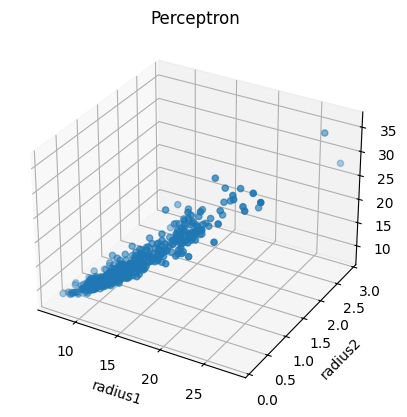

In [5]:
from matplotlib import pyplot as plt


fig = plt.figure()

ax = fig.add_subplot(projection='3d')

ax.scatter(X['radius1'],X['radius2'], X['radius3'])

ax.set_xlabel('radius1')
ax.set_ylabel('radius2')
ax.set_zlabel('radius3')

plt.title("Perceptron")
plt.show()

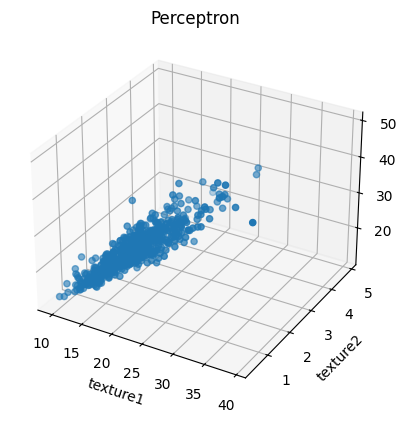

In [6]:
from matplotlib import pyplot as plt


fig = plt.figure()

ax = fig.add_subplot(projection='3d')

ax.scatter(X['texture1'],X['texture2'], X['texture3'])

ax.set_xlabel('texture1')
ax.set_ylabel('texture2')
ax.set_zlabel('texture3')

plt.title("Perceptron")
plt.show()

In [7]:
import seaborn as sb

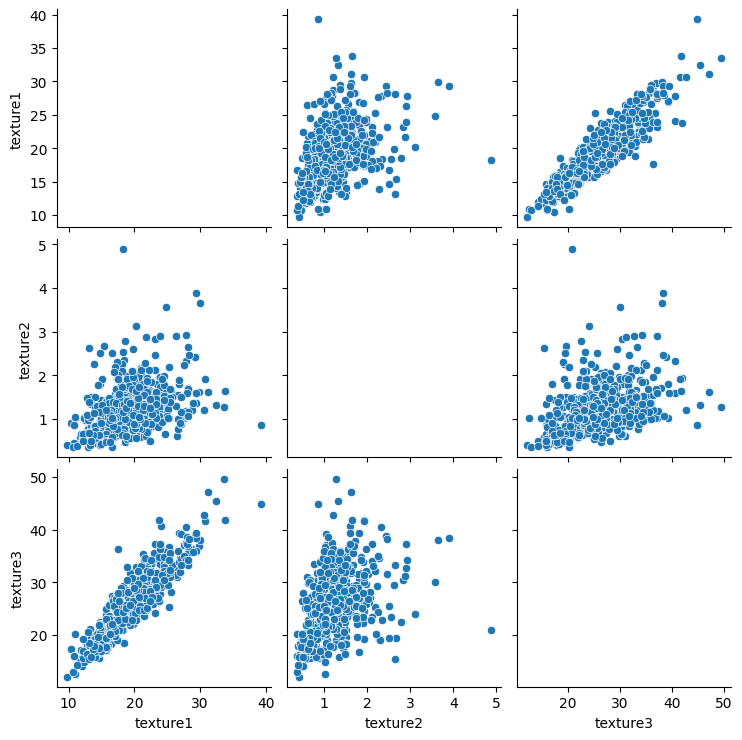

In [8]:
sb.pairplot(X[['texture1']+['texture2']+['texture3']], diag_kind="kode")

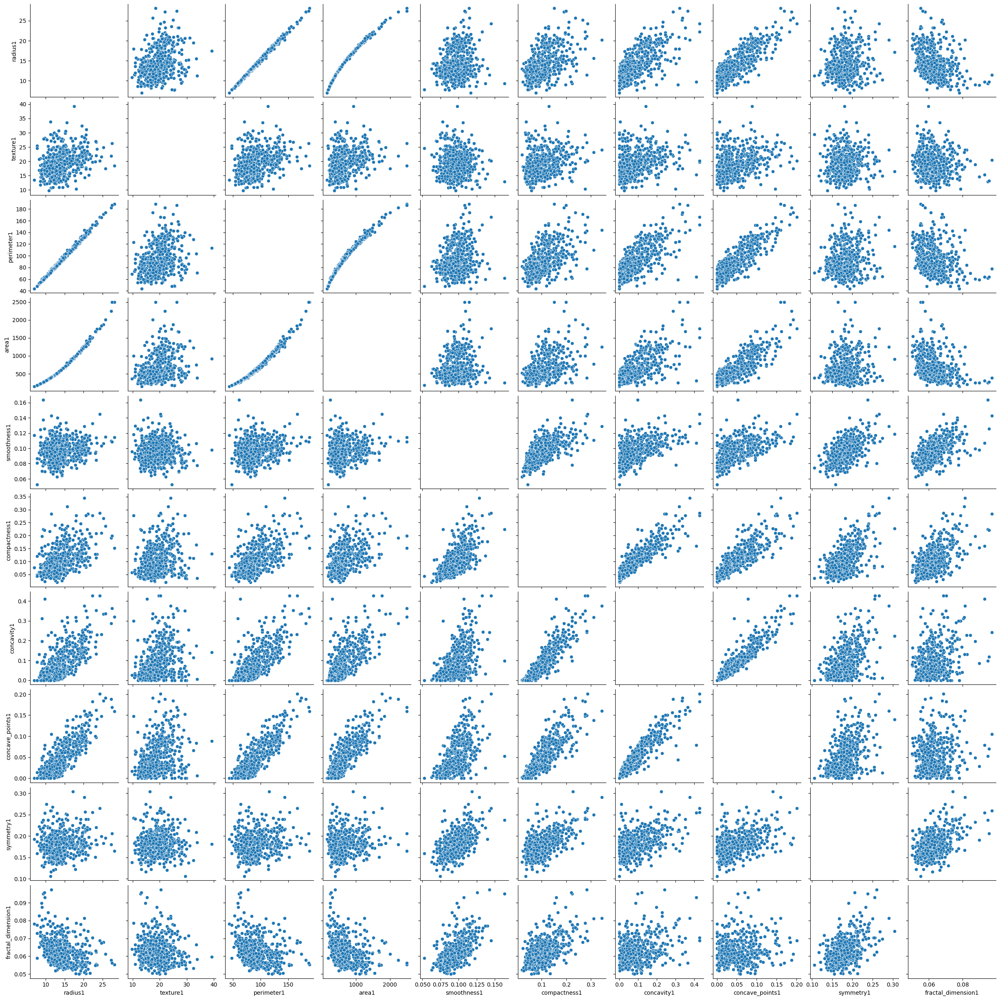

In [9]:
sb.pairplot(X.iloc[:,:10], diag_kind="kode")

In [10]:
sb.pairplot(X, diag_kind="kode")

## Zadanie 2

Proszę dokonać czyszczenia danych, sprawdzić czy nie ma danych brakujących oraz dokonać skalowania danych

In [13]:
# YOUR CODE HERE
import sklearn as skl
import sklearn.preprocessing as prc
X_scaled = prc.StandardScaler().fit_transform(X[["radius1"] + ["texture1"] + ["smoothness1"]])

In [14]:
X_scaled

array([[ 1.09706398, -2.07333501,  1.56846633],
       [ 1.82982061, -0.35363241, -0.82696245],
       [ 1.57988811,  0.45618695,  0.94221044],
       ...,
       [ 0.70228425,  2.0455738 , -0.84048388],
       [ 1.83834103,  2.33645719,  1.52576706],
       [-1.80840125,  1.22179204, -3.11208479]])

In [15]:
X[["radius1"] + ["texture1"] + ["smoothness1"]]

,radius1,texture1,smoothness1
0,17.99,10.38,0.11840
1,20.57,17.77,0.08474
2,19.69,21.25,0.10960
3,11.42,20.38,0.14250
4,20.29,14.34,0.10030
...,...,...,...
564,21.56,22.39,0.11100
565,20.13,28.25,0.09780
566,16.60,28.08,0.08455
567,20.60,29.33,0.11780


In [16]:
from sklearn.preprocessing import LabelEncoder

y = pd.DataFrame({'Diagnosis' : LabelEncoder().fit_transform(y)})

C:\Users\GIGABYTE\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


## Zadanie 3

Proszę zaimplementować algorytm KNN. Algorytm ma być w stanie dokonać klasyfikacji zarówno dla dwóch, jak i trzech cech. Parametr k ma być możliwy do podania na wejście algorytmu.

In [17]:
# YOUR CODE HERE
import numpy as np
from collections import Counter

class KNN:
    def __init__(self, k=3):
        self.k = k
    
    def fit(self, X, y):
        self.X_train = X
        self.y_train = y
    
    def predict(self, X):
        predictions = [self._predict(x) for x in X]
        return np.array(predictions)
    
    def predict_proba(self, X):
        probas = [self._predict_proba(x) for x in X]
        return np.array(probas)
    
    def evaluate(self, X, y):
        return skl.metrics.accuracy_score(y, self.predict(X))
    
    def _predict(self, x):
        distances = [self._euclidean_distance(x, x_train) for x_train in self.X_train]
        k_indices = np.argsort(distances)[:self.k]
        k_nearest_labels = np.array([self.y_train.iloc[i].Diagnosis for i in k_indices])
        most_common = Counter(k_nearest_labels).most_common(1)
        return most_common[0][0]
    
    def _predict_proba(self, x):
        distances = [self._euclidean_distance(x, x_train) for x_train in self.X_train]
        k_indices = np.argsort(distances)[:self.k]
        k_nearest_labels = np.array([self.y_train.iloc[i].Diagnosis for i in k_indices])
        label_counts = Counter(k_nearest_labels)
        prob_positive = label_counts[1] / self.k if 1 in label_counts else 0
        prob_negative = label_counts[0] / self.k if 0 in label_counts else 0
        return [prob_negative, prob_positive]
    
    def _euclidean_distance(self, x1, x2):
        return np.sqrt(np.sum((x1 - x2) ** 2))

## Zadanie 4

Proszę wytrenować model z użyciem zbiotu danych. Proszę pamiętać o odpowienim podziale na zbiór uczący i treningowy. Klasyfikator powinien być trenowany na zbiorze treningowym, a wynik jego skuteczności po trenowaniu obliczany w oparciu o zbiór testowy.

Proszę przygotować wyniki, trenując algorytm z użyciem różnych parametrów k - należy przygotować wykresy (oś pionowa określa skuteczność, pozioma wartość parametru) pokazujące jak zmienia się skuteczność działania w zależności od zastosowanego parameteru k. Proszę o przygotowanie odpowiedniego porównania (tabela), co można zaobserwować?

In [18]:
#YOUR CODE HERE
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [19]:
model = KNN(3)
model.fit(X_train, y_train)

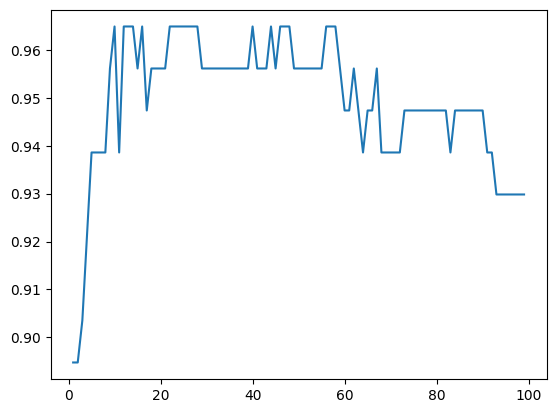

In [20]:
results = []
for i in range (1,100):
    model.k = i
    results.append(model.evaluate(X_test,y_test))

plt.plot(range(1,100), results)


In [21]:
wyniki = pd.DataFrame({
  "k": [i for i in range(1,100)],
  "evaluation": results
})
wyniki.sort_values(by="evaluation", ascending=False)

,k,evaluation
46,47,0.964912
25,26,0.964912
23,24,0.964912
22,23,0.964912
21,22,0.964912
...,...,...
92,93,0.929825
3,4,0.921053
2,3,0.903509
1,2,0.894737


## Zadanie 5

Proszę porównać działanie zaimplementowanego algorytmu z implementacją z Scikit-learn. Proszę dokonać porównania w oparciu o szybkość oraz skuteczność działania. Jakie wnioski można wyciągnać?

In [22]:
# YOUR CODE HERE
import sklearn.neighbors as neighbors

model_sklearn = neighbors.KNeighborsClassifier()
model = KNN()
model.fit(X_train, y_train)
model_sklearn.fit(X_train, y_train)
results = []
results2 = []
for i in range (1,100):
    model.k = i
    results.append(model.evaluate(X_test,y_test))
    model_sklearn.n_neighbors = i
    results2.append(model_sklearn.score(X_test, y_test))

C:\Users\GIGABYTE\AppData\Roaming\Python\Python311\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


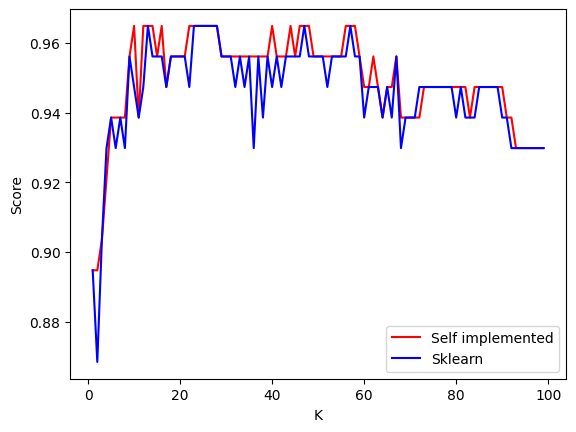

In [23]:
plt.plot(range(1,100), results, c='r', label='Self implemented')
plt.plot(range(1,100), results2, c='b', label='Sklearn')
plt.legend()
plt.xlabel('K')
plt.ylabel('Score')
plt.show()

## Zadanie 6

Proszę wyrysować krzywą ROC oraz obliczyć miarę AUC dla wytrenowanych modeli.

C:\Users\GIGABYTE\AppData\Roaming\Python\Python311\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


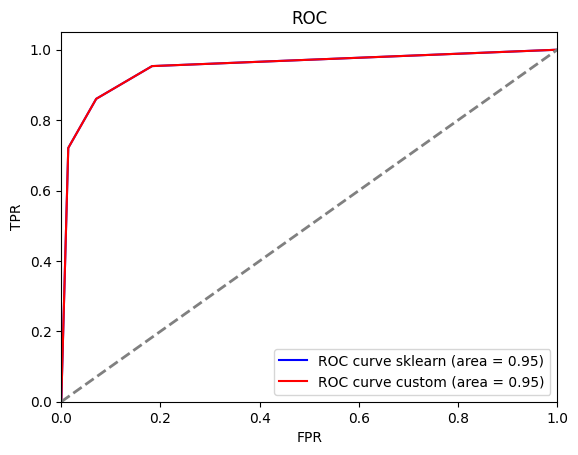

AUC dla sklearn: 0.95
AUC dla zaimplementowanego: 0.95


In [24]:
# YOUR CODE HERE
from sklearn.metrics import roc_curve, auc

model_sklearn = neighbors.KNeighborsClassifier(n_neighbors=3)
model_sklearn.fit(X_train, y_train)

model = KNN(k=3)
model.fit(X_train, y_train)

y_prob_sklearn = model_sklearn.predict_proba(X_test)[:, 1]
y_prob_custom = model.predict_proba(X_test)[:, 1]

fpr_sklearn, tpr_sklearn, _ = roc_curve(y_test, y_prob_sklearn)
roc_auc_sklearn = auc(fpr_sklearn, tpr_sklearn)

fpr_custom, tpr_custom, _ = roc_curve(y_test, y_prob_custom)
roc_auc_custom = auc(fpr_custom, tpr_custom)

plt.figure()
plt.plot(fpr_sklearn, tpr_sklearn, color='blue',  label='ROC curve sklearn (area = %0.2f)' % roc_auc_sklearn)
plt.plot(fpr_custom, tpr_custom, color='red',  label='ROC curve custom (area = %0.2f)' % roc_auc_custom)
plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC')
plt.legend()
plt.show()

print(f'AUC dla sklearn: {roc_auc_sklearn:.2f}')
print(f'AUC dla zaimplementowanego: {roc_auc_custom:.2f}')
